## **Install the necessary libraries**

In [1]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 34.5 MB/s eta 0:00:00


## **Import the necessary libraries**

In [2]:
from ultralytics import YOLO
import torch
import os
from pathlib import Path
import yaml
import shutil

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


## **Enable GPU**

In [ ]:
print(f"✅ CUDA available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"✅ GPU: {torch.cuda.get_device_name(0)}")
else:
    print("⚠️ Running on CPU (slower)")

✅ CUDA available: True
✅ GPU: Tesla T4


## **Verify the dataset(exported from the Roboflow in YOLO Model)**

In [ ]:
def verify_dataset(dataset_path):
    """
    Check if dataset is properly formatted
    """
    print("="*50)
    print("DATASET VERIFICATION")
    print("="*50)

    # Check data.yaml exists
    data_yaml_path = os.path.join(dataset_path, 'data.yaml')
    if os.path.exists(data_yaml_path):
        print("✅ data.yaml found")

        # Read and display data.yaml
        with open(data_yaml_path, 'r') as f:
            config = yaml.safe_load(f)
            print(f"\n📊 Classes: {config['nc']}")
            print(f"📝 Names: {config['names']}")
    else:
        print("❌ data.yaml NOT found!")
        return False

    # Check train folder
    train_img_path = os.path.join(dataset_path, 'train/images')
    train_lbl_path = os.path.join(dataset_path, 'train/labels')

    if os.path.exists(train_img_path):
        train_images = len([f for f in os.listdir(train_img_path) if f.endswith(('.jpg', '.png'))])
        train_labels = len([f for f in os.listdir(train_lbl_path) if f.endswith('.txt')])
        print(f"\n✅ Train Images: {train_images}")
        print(f"✅ Train Labels: {train_labels}")

        if train_images != train_labels:
            print(f"⚠️ Warning: Image count != Label count")
    else:
        print("❌ Train folder NOT found!")
        return False

    # Check valid folder
    valid_img_path = os.path.join(dataset_path, 'valid/images')
    valid_lbl_path = os.path.join(dataset_path, 'valid/labels')

    if os.path.exists(valid_img_path):
        valid_images = len([f for f in os.listdir(valid_img_path) if f.endswith(('.jpg', '.png'))])
        valid_labels = len([f for f in os.listdir(valid_lbl_path) if f.endswith('.txt')])
        print(f"✅ Valid Images: {valid_images}")
        print(f"✅ Valid Labels: {valid_labels}")
    else:
        print("❌ Valid folder NOT found!")
        return False

    # Check test folder (optional)
    test_img_path = os.path.join(dataset_path, 'test/images')
    if os.path.exists(test_img_path):
        test_images = len([f for f in os.listdir(test_img_path) if f.endswith(('.jpg', '.png'))])
        print(f"✅ Test Images: {test_images}")
    else:
        print("⚠️ Test folder not found (optional)")

    print("\n" + "="*50)
    print("✅ DATASET VERIFICATION COMPLETE!")
    print("="*50)
    return True

# Run verification
dataset_path = '/content/drive/MyDrive/Data_1_'  # Adjust this path
verify_dataset(dataset_path)

DATASET VERIFICATION
✅ data.yaml found

📊 Classes: 14
📝 Names: ['bread', 'carmel', 'chicken_curry', 'cupcakes', 'french_fries', 'fried_rice', 'ice_cream', 'omlette', 'pancakes', 'pizza', 'rice', 'sause', 'steak', 'waffles']

✅ Train Images: 168
✅ Train Labels: 168
✅ Valid Images: 48
✅ Valid Labels: 48
✅ Test Images: 24

✅ DATASET VERIFICATION COMPLETE!


True

## **Configure the data.yaml file for better structure and understable**

In [ ]:
def update_data_yaml(dataset_path):
    """
    Update data.yaml with correct absolute paths
    """
    data_yaml_path = os.path.join(dataset_path, 'data.yaml')

    # Read existing config
    with open(data_yaml_path, 'r') as f:
        config = yaml.safe_load(f)

    # Update paths to absolute paths
    config['path'] = dataset_path
    config['train'] = 'train/images'
    config['val'] = 'valid/images'
    config['test'] = 'test/images'  # Optional

    # Save updated config
    with open(data_yaml_path, 'w') as f:
        yaml.dump(config, f, default_flow_style=False)

    print("✅ data.yaml updated with correct paths!")
    print(f"📁 Dataset path: {dataset_path}")

    # Display final config
    print("\n📄 Final data.yaml:")
    with open(data_yaml_path, 'r') as f:
        print(f.read())

# Update data.yaml
update_data_yaml(dataset_path)

✅ data.yaml updated with correct paths!
📁 Dataset path: /content/drive/MyDrive/Data_1_

📄 Final data.yaml:
names:
- bread
- carmel
- chicken_curry
- cupcakes
- french_fries
- fried_rice
- ice_cream
- omlette
- pancakes
- pizza
- rice
- sause
- steak
- waffles
nc: 14
path: /content/drive/MyDrive/Data_1_
roboflow:
  license: CC BY 4.0
  project: food_detetction-qvwkb
  url: https://universe.roboflow.com/labelling-zfvpc/food_detetction-qvwkb/dataset/2
  version: 2
  workspace: labelling-zfvpc
test: test/images
train: train/images
val: valid/images



## **Verify or visualize the sample images with the bounding boxes**

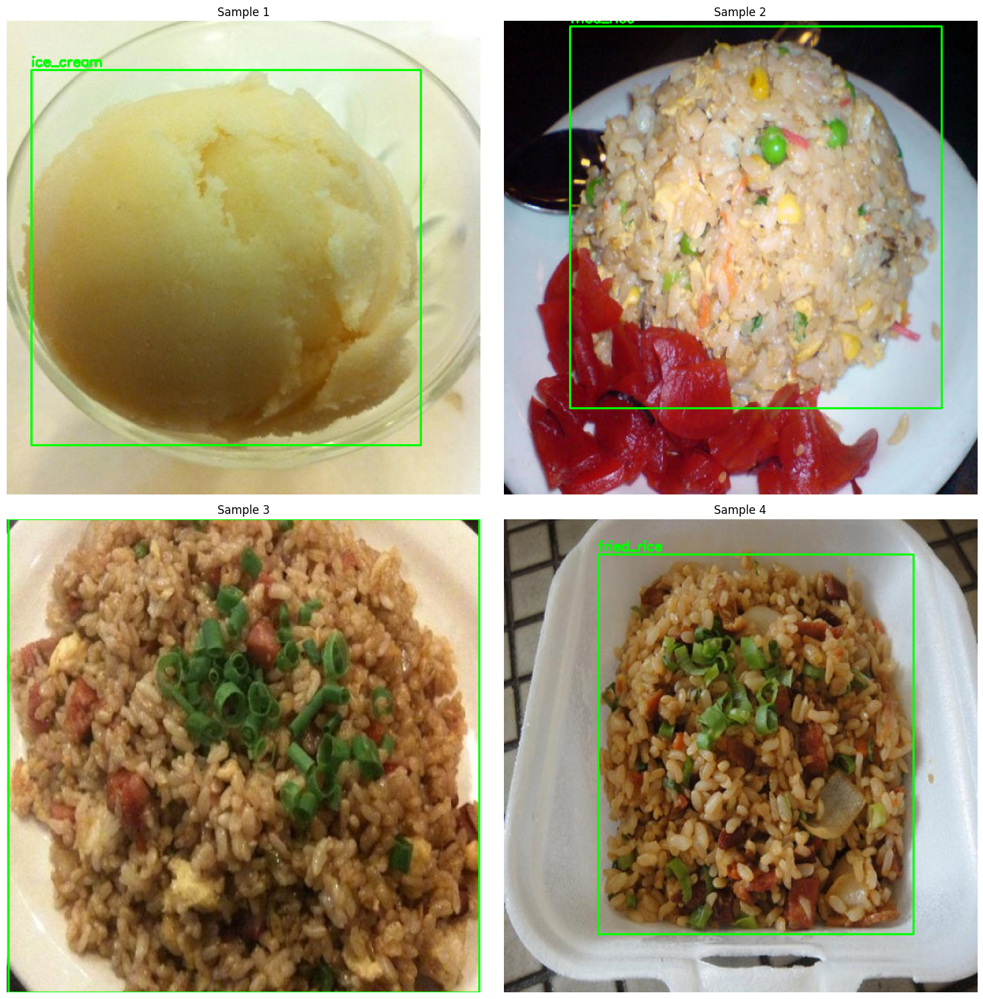

✅ Visualization complete!


In [ ]:
import cv2
import matplotlib.pyplot as plt
import random

def visualize_samples(dataset_path, num_samples=4):
    """
    Visualize sample images with bounding boxes
    """
    train_img_path = os.path.join(dataset_path, 'train/images')
    train_lbl_path = os.path.join(dataset_path, 'train/labels')

    # Get random images
    images = [f for f in os.listdir(train_img_path) if f.endswith(('.jpg', '.png'))]
    samples = random.sample(images, min(num_samples, len(images)))

    # Load class names
    data_yaml_path = os.path.join(dataset_path, 'data.yaml')
    with open(data_yaml_path, 'r') as f:
        config = yaml.safe_load(f)
    class_names = config['names']

    fig, axes = plt.subplots(2, 2, figsize=(15, 15))
    axes = axes.flatten()

    for idx, img_name in enumerate(samples):
        # Read image
        img_path = os.path.join(train_img_path, img_name)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        h, w = img.shape[:2]

        # Read labels
        label_name = img_name.replace('.jpg', '.txt').replace('.png', '.txt')
        label_path = os.path.join(train_lbl_path, label_name)

        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                lines = f.readlines()

            # Draw bounding boxes
            for line in lines:
                parts = line.strip().split()
                class_id = int(parts[0])
                center_x, center_y, width, height = map(float, parts[1:5])

                # Convert YOLO format to pixel coordinates
                x1 = int((center_x - width/2) * w)
                y1 = int((center_y - height/2) * h)
                x2 = int((center_x + width/2) * w)
                y2 = int((center_y + height/2) * h)

                # Draw rectangle
                cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)

                # Put label
                label = class_names[class_id]
                cv2.putText(img, label, (x1, y1-5),
                           cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)

        axes[idx].imshow(img)
        axes[idx].set_title(f"Sample {idx+1}")
        axes[idx].axis('off')

    plt.tight_layout()
    plt.show()
    print("✅ Visualization complete!")

# Visualize samples
visualize_samples(dataset_path, num_samples=4)

## **Intilize the YOLO model**

In [ ]:
model = YOLO('yolov8n.pt')
# Path to data.yaml
data_yaml = os.path.join(dataset_path, 'data.yaml')

## **Training the images with the model(Training Parameters)**

In [ ]:
results = model.train(
    # Dataset
    data=data_yaml,

    # Training parameters
    epochs=100,
    imgsz=640,
    batch=16,

    # Model saving
    name='food_detector',
    project='runs/detect',
    save=True,
    save_period=10,

    # Early stopping
    patience=20,             # Stop if no improvement for N epochs

    # Optimization
    optimizer='auto',
    lr0=0.01,
    lrf=0.01,
    momentum=0.937,
    weight_decay=0.0005,

    # Augmentation
    hsv_h=0.015,             # HSV-Hue augmentation
    hsv_s=0.7,               # HSV-Saturation
    hsv_v=0.4,               # HSV-Value
    degrees=10,              # Rotation (+/- deg)
    translate=0.1,           # Translation (+/- fraction)
    scale=0.5,               # Scale (+/- gain)
    shear=0.0,               # Shear (+/- deg)
    perspective=0.0,         # Perspective (+/- fraction)
    flipud=0.0,              # Flip up-down probability
    fliplr=0.5,              # Flip left-right probability
    mosaic=1.0,              # Mosaic augmentation probability
    mixup=0.1,               # Mixup augmentation probability
    copy_paste=0.0,          # Copy-paste augmentation probability

    # Visualization
    plots=True,              # Save training plots
    verbose=True,            # Verbose output

    # Device
    device=0,

    # Advanced
    exist_ok=True,           # Overwrite existing experiment
    pretrained=True,         # Use pretrained weights
    resume=False,            # Resume from last checkpoint
)

print("\n" + "="*50)
print("✅ TRAINING COMPLETE!")
print("="*50)

Ultralytics 8.3.222 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/Data_1_/data.yaml, degrees=10, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.1, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=food_detector, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=20, perspective=0.0, plo

## **Evaluation metrics**

In [ ]:
best_model_path = 'runs/detect/food_detector/weights/best.pt'
model = YOLO(best_model_path)

# Validate
metrics = model.val(data=data_yaml, split='val')

print("\n" + "="*50)
print("📊 VALIDATION METRICS")
print("="*50)
print(f"mAP50: {metrics.box.map50:.4f}")          # mAP at IoU=0.50
print(f"mAP50-95: {metrics.box.map:.4f}")         # mAP at IoU=0.50:0.95
print(f"Precision: {metrics.box.mp:.4f}")         # Mean precision
print(f"Recall: {metrics.box.mr:.4f}")            # Mean recall
print(f"F1 Score: {2 * metrics.box.mp * metrics.box.mr / (metrics.box.mp + metrics.box.mr):.4f}")
print("="*50)

# Test on test set (if available)
if os.path.exists(os.path.join(dataset_path, 'test/images')):
    test_metrics = model.val(data=data_yaml, split='test')
    print(f"\n📊 TEST SET METRICS")
    print(f"mAP50: {test_metrics.box.map50:.4f}")
    print(f"mAP50-95: {test_metrics.box.map:.4f}")

Ultralytics 8.3.222 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,008,378 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.5±0.2 ms, read: 24.5±7.7 MB/s, size: 41.7 KB)
val: Scanning /content/drive/MyDrive/Data_1_/valid/labels.cache... 48 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 48/48 88.0Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.5it/s 2.0s
                   all         48         62      0.676      0.497      0.621      0.411
                carmel          2          3      0.591      0.667      0.557      0.302
         chicken_curry          4          4      0.535       0.75      0.783       0.57
              cupcakes          6          9          1      0.291      0.757      0.494
          french_fries         10         10      0.563        0.6      0.649      0.527
            fried_rice          5          5

## **Test the model in sample images**


6709_jpg.rf.e03a07d0f322223550c8850ab308e047.jpg:

87020_jpg.rf.a1d8e2b66fe0adb4dee8f84a541b0fce.jpg:
  - french_fries: 88.34%
  - french_fries: 86.22%

80315_jpg.rf.ea3089333665f9cc48453a491fb2c13f.jpg:
  - french_fries: 97.03%

966174_jpg.rf.79a44dad39161717ce95c8cf6506cc65.jpg:
  - french_fries: 96.64%
  - steak: 63.32%


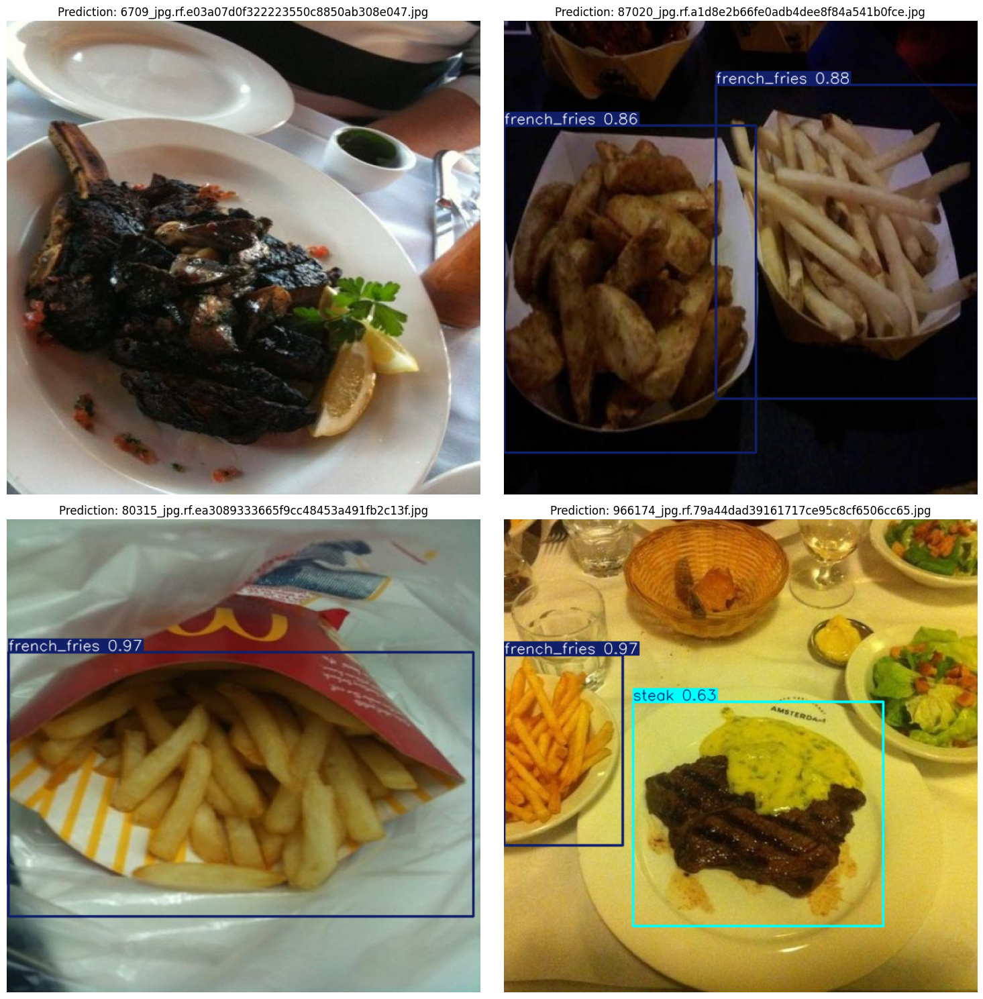

In [ ]:
import matplotlib.pyplot as plt
import cv2
import numpy as np

def test_predictions(model, test_images_path, num_samples=4, conf_threshold=0.5):
    """
    Test model on sample images and visualize results
    """
    # Get sample images
    images = [f for f in os.listdir(test_images_path) if f.endswith(('.jpg', '.png'))]
    samples = random.sample(images, min(num_samples, len(images)))

    fig, axes = plt.subplots(2, 2, figsize=(15, 15))
    axes = axes.flatten()

    for idx, img_name in enumerate(samples):
        img_path = os.path.join(test_images_path, img_name)

        # Predict
        results = model.predict(
            source=img_path,
            conf=conf_threshold,
            verbose=False
        )

        # Get annotated image
        annotated = results[0].plot()
        annotated_rgb = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)

        # Display
        axes[idx].imshow(annotated_rgb)
        axes[idx].set_title(f"Prediction: {img_name}")
        axes[idx].axis('off')

        # Print detections
        print(f"\n{img_name}:")
        for box in results[0].boxes:
            class_id = int(box.cls[0])
            confidence = float(box.conf[0])
            class_name = model.names[class_id]
            print(f"  - {class_name}: {confidence:.2%}")

    plt.tight_layout()
    plt.show()

# Test on validation images
test_img_path = os.path.join(dataset_path, 'valid/images')
test_predictions(model, test_img_path, num_samples=4, conf_threshold=0.5)

## **Perdict with new images**

Saving 55114.jpg to 55114.jpg
Results saved to /content/runs/detect/predict


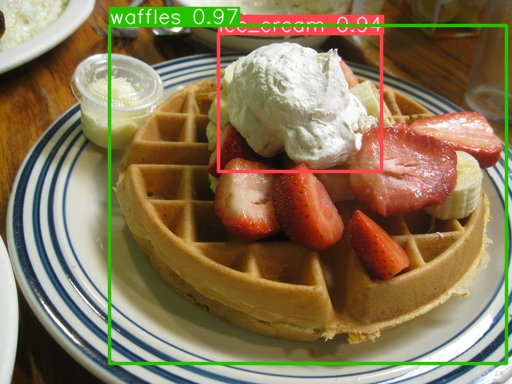


🍽️ Detected Food Items:
✅ waffles: 97.0%
✅ ice_cream: 94.5%


In [ ]:
from google.colab import files
uploaded = files.upload()

# Get uploaded filename
uploaded_filename = list(uploaded.keys())[0]

# Predict
results = model.predict(
    source=uploaded_filename,
    conf=0.5,        # Confidence threshold
    iou=0.6,         # IoU threshold for NMS
    save=True,       # Save results
    show_labels=True,
    show_conf=True,
)

# Display result
from IPython.display import Image, display
result_path = results[0].save_dir
display(Image(filename=f'{result_path}/{uploaded_filename}'))

# Print detections
print("\n🍽️ Detected Food Items:")
for box in results[0].boxes:
    class_name = model.names[int(box.cls[0])]
    confidence = float(box.conf[0])
    print(f"✅ {class_name}: {confidence:.1%}")

## **Save the model**

In [ ]:
import shutil

# Create directory in Drive
save_dir = '/content/drive/MyDrive/food_detection_models/'
os.makedirs(save_dir, exist_ok=True)

# Copy best model
best_model_path = 'runs/detect/food_detector/weights/best.pt'
drive_model_path = os.path.join(save_dir, 'food_detector_best.pt')
shutil.copy(best_model_path, drive_model_path)

# Copy last model (for resume training)
last_model_path = 'runs/detect/food_detector/weights/last.pt'
drive_last_path = os.path.join(save_dir, 'food_detector_last.pt')
shutil.copy(last_model_path, drive_last_path)

# Copy training results
results_dir = 'runs/detect/food_detector'
drive_results_dir = os.path.join(save_dir, 'training_results')
shutil.copytree(results_dir, drive_results_dir, dirs_exist_ok=True)

print("✅ Model saved to Google Drive!")
print(f"📁 Location: {save_dir}")
print(f"   - Best model: food_detector_best.pt")
print(f"   - Last model: food_detector_last.pt")
print(f"   - Training results: training_results/")

✅ Model saved to Google Drive!
📁 Location: /content/drive/MyDrive/food_detection_models/
   - Best model: food_detector_best.pt
   - Last model: food_detector_last.pt
   - Training results: training_results/


## **Full code with Trained model(best) and upload the images and check the ouput**

🍽️ Detected Food Items:
  - chicken_curry: 85.2%


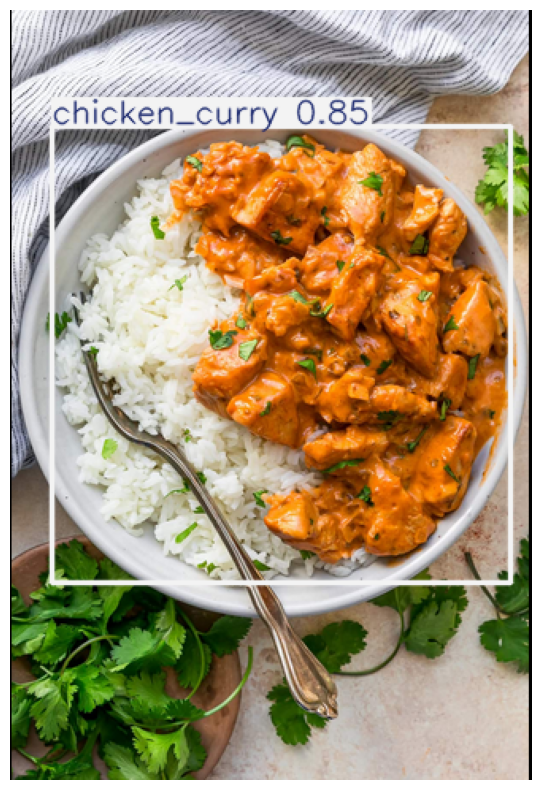

In [9]:
import matplotlib.pyplot as plt
import cv2
import numpy as np
from ultralytics import YOLO
import os

def detect_food_items(image_path, model_path, conf_threshold=0.5, iou_threshold=0.6):
    """
    Complete inference pipeline for food detection

    Args:
        image_path: Path to image
        model_path: Path to trained model
        conf_threshold: Confidence threshold (0-1)
        iou_threshold: IoU threshold for NMS (0-1)

    Returns:
        detections: List of detected food items with confidence
        annotated_image: Image with bounding boxes
    """
    # Load model
    model = YOLO(model_path)

    # Predict
    results = model.predict(
        source=image_path,
        conf=conf_threshold,
        iou=iou_threshold,
        verbose=False
    )

    # Extract detections
    detections = []
    for box in results[0].boxes:
        detection = {
            'class_id': int(box.cls[0]),
            'class_name': model.names[int(box.cls[0])],
            'confidence': float(box.conf[0]),
            'bbox': box.xyxy[0].cpu().numpy().tolist()
        }
        detections.append(detection)

    # Get annotated image
    annotated_image = results[0].plot()

    return detections, annotated_image

# Test the function
detections, annotated = detect_food_items(
    image_path='chicken1.png',
    model_path='/content/drive/MyDrive/food_detection_models/food_detector_best.pt',
    conf_threshold=0.5,
    iou_threshold=0.6
)

# Print results
print("🍽️ Detected Food Items:")
for det in detections:
    print(f"  - {det['class_name']}: {det['confidence']:.1%}")

# Display image
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

### **Check 1**

🍽️ Detected Food Items:
  - omlette: 93.6%


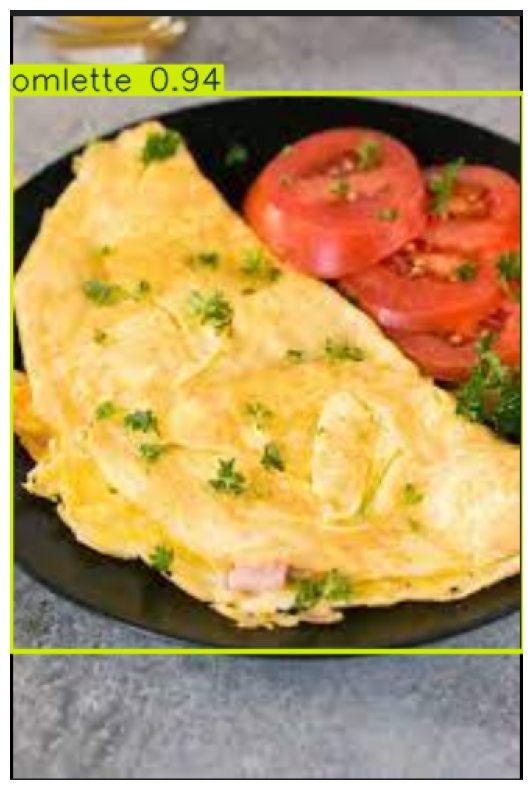

In [10]:
import matplotlib.pyplot as plt
import cv2
import numpy as np
from ultralytics import YOLO
import os

def detect_food_items(image_path, model_path, conf_threshold=0.5, iou_threshold=0.6):
    """
    Complete inference pipeline for food detection

    Args:
        image_path: Path to image
        model_path: Path to trained model
        conf_threshold: Confidence threshold (0-1)
        iou_threshold: IoU threshold for NMS (0-1)

    Returns:
        detections: List of detected food items with confidence
        annotated_image: Image with bounding boxes
    """
    # Load model
    model = YOLO(model_path)

    # Predict
    results = model.predict(
        source=image_path,
        conf=conf_threshold,
        iou=iou_threshold,
        verbose=False
    )

    # Extract detections
    detections = []
    for box in results[0].boxes:
        detection = {
            'class_id': int(box.cls[0]),
            'class_name': model.names[int(box.cls[0])],
            'confidence': float(box.conf[0]),
            'bbox': box.xyxy[0].cpu().numpy().tolist()
        }
        detections.append(detection)

    # Get annotated image
    annotated_image = results[0].plot()

    return detections, annotated_image

# Test the function
detections, annotated = detect_food_items(
    image_path='omlette.png',
    model_path='/content/drive/MyDrive/food_detection_models/food_detector_best.pt',
    conf_threshold=0.5,
    iou_threshold=0.6
)

# Print results
print("🍽️ Detected Food Items:")
for det in detections:
    print(f"  - {det['class_name']}: {det['confidence']:.1%}")

# Display image
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

### **Check 2**

🍽️ Detected Food Items:
  - waffles: 98.9%
  - carmel: 93.7%


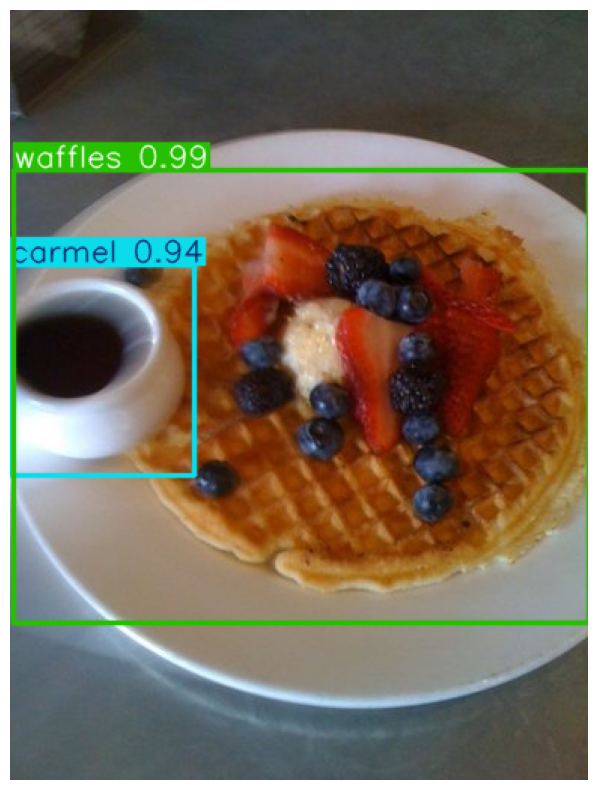

In [13]:
import matplotlib.pyplot as plt
import cv2
import numpy as np
from ultralytics import YOLO
import os

def detect_food_items(image_path, model_path, conf_threshold=0.5, iou_threshold=0.6):
    """
    Complete inference pipeline for food detection

    Args:
        image_path: Path to image
        model_path: Path to trained model
        conf_threshold: Confidence threshold (0-1)
        iou_threshold: IoU threshold for NMS (0-1)

    Returns:
        detections: List of detected food items with confidence
        annotated_image: Image with bounding boxes
    """
    # Load model
    model = YOLO(model_path)

    # Predict
    results = model.predict(
        source=image_path,
        conf=conf_threshold,
        iou=iou_threshold,
        verbose=False
    )

    # Extract detections
    detections = []
    for box in results[0].boxes:
        detection = {
            'class_id': int(box.cls[0]),
            'class_name': model.names[int(box.cls[0])],
            'confidence': float(box.conf[0]),
            'bbox': box.xyxy[0].cpu().numpy().tolist()
        }
        detections.append(detection)

    # Get annotated image
    annotated_image = results[0].plot()

    return detections, annotated_image

# Test the function
detections, annotated = detect_food_items(
    image_path='57325.jpg',
    model_path='/content/drive/MyDrive/food_detection_models/food_detector_best.pt',
    conf_threshold=0.5,
    iou_threshold=0.6
)

# Print results
print("🍽️ Detected Food Items:")
for det in detections:
    print(f"  - {det['class_name']}: {det['confidence']:.1%}")

# Display image
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

### **Check 3**

🍽️ Detected Food Items:
  - waffles: 92.5%


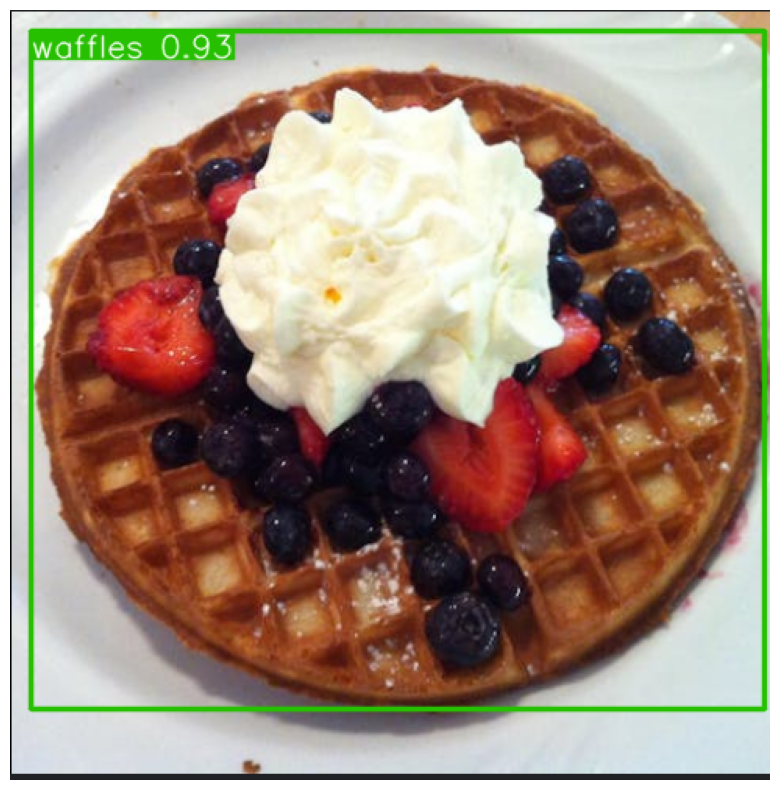

In [16]:
import matplotlib.pyplot as plt
import cv2
import numpy as np
from ultralytics import YOLO
import os

def detect_food_items(image_path, model_path, conf_threshold=0.5, iou_threshold=0.6):
    """
    Complete inference pipeline for food detection

    Args:
        image_path: Path to image
        model_path: Path to trained model
        conf_threshold: Confidence threshold (0-1)
        iou_threshold: IoU threshold for NMS (0-1)

    Returns:
        detections: List of detected food items with confidence
        annotated_image: Image with bounding boxes
    """
    # Load model
    model = YOLO(model_path)

    # Predict
    results = model.predict(
        source=image_path,
        conf=conf_threshold,
        iou=iou_threshold,
        verbose=False
    )

    # Extract detections
    detections = []
    for box in results[0].boxes:
        detection = {
            'class_id': int(box.cls[0]),
            'class_name': model.names[int(box.cls[0])],
            'confidence': float(box.conf[0]),
            'bbox': box.xyxy[0].cpu().numpy().tolist()
        }
        detections.append(detection)

    # Get annotated image
    annotated_image = results[0].plot()

    return detections, annotated_image

# Test the function
detections, annotated = detect_food_items(
    image_path='waffles1.png',
    model_path='/content/drive/MyDrive/food_detection_models/food_detector_best.pt',
    conf_threshold=0.5,
    iou_threshold=0.6
)

# Print results
print("🍽️ Detected Food Items:")
for det in detections:
    print(f"  - {det['class_name']}: {det['confidence']:.1%}")

# Display image
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

### **Check 4**

🍽️ Detected Food Items:
  - pizza: 97.1%
  - french_fries: 87.7%


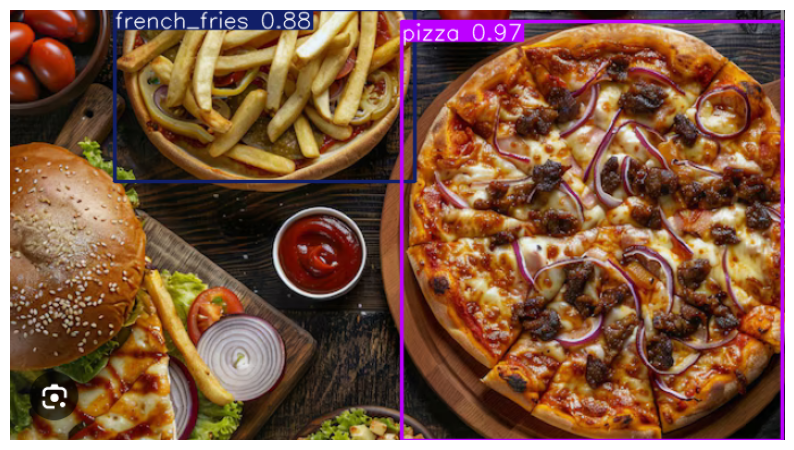

In [3]:
import matplotlib.pyplot as plt
import cv2
import numpy as np
from ultralytics import YOLO
import os

def detect_food_items(image_path, model_path, conf_threshold=0.5, iou_threshold=0.6):
    """
    Complete inference pipeline for food detection

    Args:
        image_path: Path to image
        model_path: Path to trained model
        conf_threshold: Confidence threshold (0-1)
        iou_threshold: IoU threshold for NMS (0-1)

    Returns:
        detections: List of detected food items with confidence
        annotated_image: Image with bounding boxes
    """
    # Load model
    model = YOLO(model_path)

    # Predict
    results = model.predict(
        source=image_path,
        conf=conf_threshold,
        iou=iou_threshold,
        verbose=False
    )

    # Extract detections
    detections = []
    for box in results[0].boxes:
        detection = {
            'class_id': int(box.cls[0]),
            'class_name': model.names[int(box.cls[0])],
            'confidence': float(box.conf[0]),
            'bbox': box.xyxy[0].cpu().numpy().tolist()
        }
        detections.append(detection)

    # Get annotated image
    annotated_image = results[0].plot()

    return detections, annotated_image

# Test the function
detections, annotated = detect_food_items(
    image_path='/content/Screenshot 2025-10-31 183838.png',
    model_path='/content/drive/MyDrive/food_detection_models/food_detector_best.pt',
    conf_threshold=0.5,
    iou_threshold=0.6
)

# Print results
print("🍽️ Detected Food Items:")
for det in detections:
    print(f"  - {det['class_name']}: {det['confidence']:.1%}")

# Display image
plt.figure(figsize=(10, 10))
plt.imshow(cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()